Saving food detect.v20-preprocessing_change.yolov8.zip to food detect.v20-preprocessing_change.yolov8.zip
Dataset ready at: food detect.v20-preprocessing_change.yolov8
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=food detect.v20-preprocessing_change.yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=40, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=tr

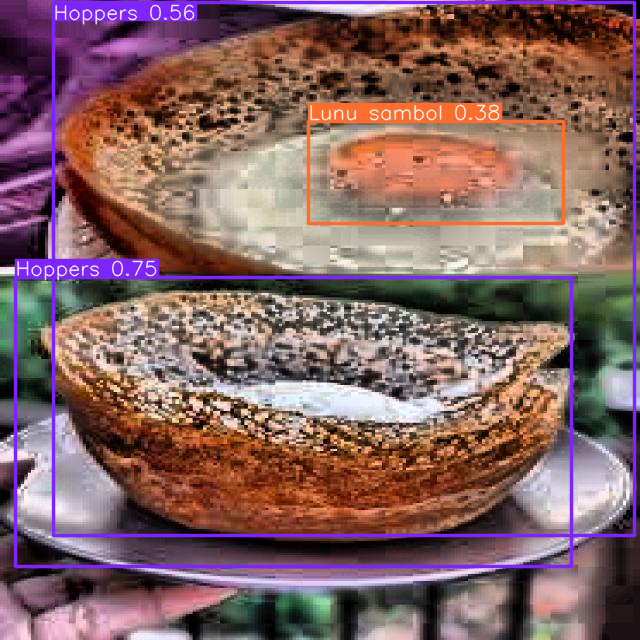

In [4]:
# Step 0: Install packages
!pip install ultralytics roboflow --quiet

# Step 1: Upload your dataset ZIP
from google.colab import files
uploaded = files.upload()  # choose your ZIP file

# Step 2: Unzip the dataset
import zipfile
import os
for fn in uploaded.keys():
    with zipfile.ZipFile(fn, 'r') as zip_ref:
        zip_ref.extractall(fn.replace(".zip",""))

dataset_path = fn.replace(".zip","")
print("Dataset ready at:", dataset_path)

# Step 3: Train a small YOLOv8 model quickly
from ultralytics import YOLO

# Use yolov8n.pt (nano) for very fast training
model = YOLO("yolov8s.pt")

# Quick training settings for testing
model.train(
    data=f"{dataset_path}/data.yaml",  # path to data.yaml
    epochs=40,                          # small number of epochs for fast start
    imgsz=640,                         # smaller images to speed up
    batch=4,                            # smaller batch for Colab free
    project="meal_plate_test",          # save results here
    name="quick_train",
    exist_ok=True,
    device=0
)

# Step 4: Test on one example image
example_image = os.path.join(dataset_path, "valid/images", os.listdir(os.path.join(dataset_path, "valid/images"))[0])
results = model.predict(example_image)
results[0].show()  # show the first (and only) result



Testing on: n11_jpg.rf.f0e6b2d2ae8bef463052b51bf4ef3d6f.jpg

image 1/1 /content/food detect.v20-preprocessing_change.yolov8/valid/images/n11_jpg.rf.f0e6b2d2ae8bef463052b51bf4ef3d6f.jpg: 640x640 1 Beans curry, 1 Dhal Curry, 2 Prawns Currys, 1 yellow rice, 16.1ms
Speed: 2.1ms preprocess, 16.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


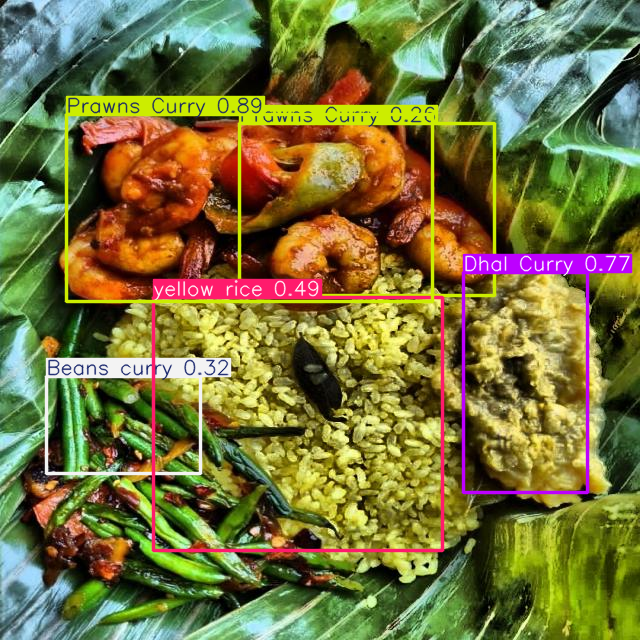

In [5]:
import random
import os

# Pick a random image from your validation set
valid_images_dir = os.path.join(dataset_path, "valid/images")
random_image = random.choice(os.listdir(valid_images_dir))
example_image = os.path.join(valid_images_dir, random_image)

print("Testing on:", random_image)
results = model.predict(example_image)
results[0].show()


Upload new meal plate images (you can select multiple):


Saving tnew.webp to tnew (1).webp
Saving tnew2.webp to tnew2 (1).webp
Saving tnew3.jpg to tnew3 (1).jpg
Saving tnew4.jpg to tnew4 (1).jpg
Saving tnew5.jpg to tnew5 (1).jpg
Saving tnew6.jpg to tnew6 (1).jpg
Saving tnew7.jpeg to tnew7 (1).jpeg
7 image(s) uploaded for testing.

--- Testing: new_food_images/tnew (1).webp ---

image 1/1 /content/new_food_images/tnew (1).webp: 640x640 1 Beans curry, 1 Beetroot Curry, 1 Chicken curry, 1 Dhal Curry, 1 Fish Curry, 1 Gotukola Mallum, 1 Pol Sambol, 1 Sprats, 1 rice, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/new_food_images/tnew (1).webp: 640x640 1 Beans curry, 1 Beetroot Curry, 1 Chicken curry, 1 Dhal Curry, 1 Fish Curry, 1 Gotukola Mallum, 1 Pol Sambol, 1 Sprats, 1 rice, 16.2ms
Speed: 2.4ms preprocess, 16.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


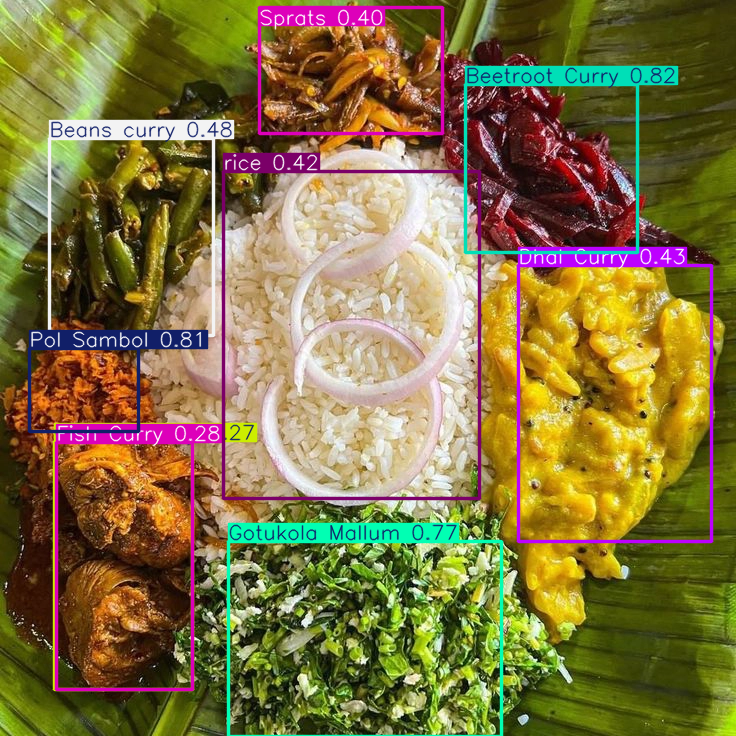

Detected foods:
  - Beetroot Curry, Confidence: 0.82
  - Pol Sambol, Confidence: 0.81
  - Gotukola Mallum, Confidence: 0.77
  - Beans curry, Confidence: 0.48
  - Dhal Curry, Confidence: 0.43
  - rice, Confidence: 0.42
  - Sprats, Confidence: 0.40
  - Fish Curry, Confidence: 0.28
  - Chicken curry, Confidence: 0.27

--- Testing: new_food_images/tnew2 (1).webp ---

image 1/1 /content/new_food_images/tnew2 (1).webp: 448x640 1 Beans curry, 1 Chicken curry, 1 Papadam, 1 Potato Curry, 1 rice, 13.7ms
Speed: 4.0ms preprocess, 13.7ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/tnew2 (1).webp: 448x640 1 Beans curry, 1 Chicken curry, 1 Papadam, 1 Potato Curry, 1 rice, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


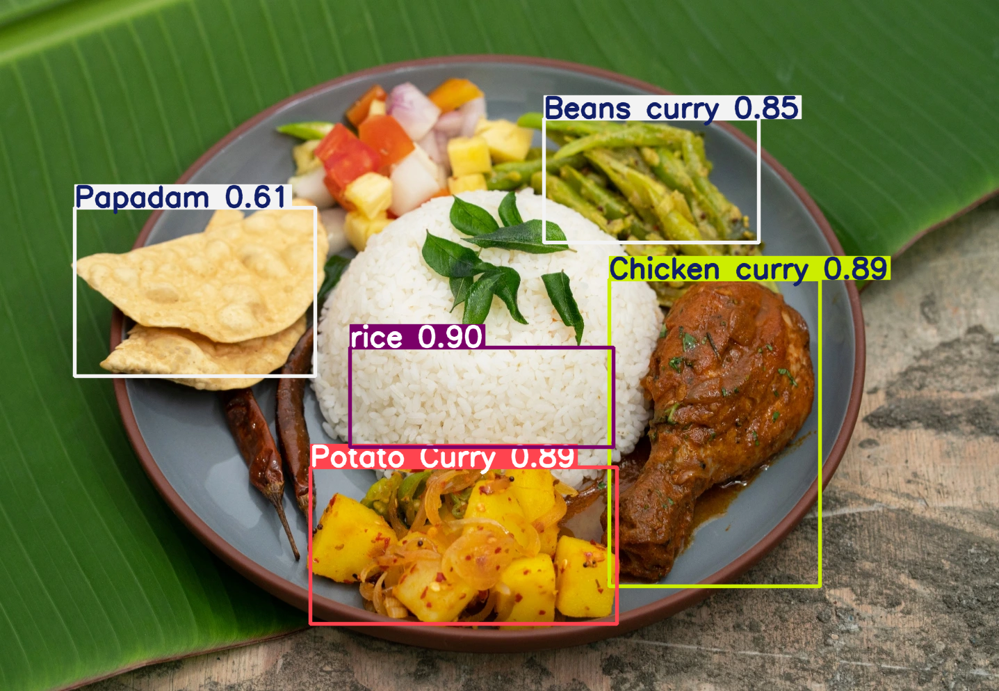

Detected foods:
  - rice, Confidence: 0.90
  - Potato Curry, Confidence: 0.89
  - Chicken curry, Confidence: 0.89
  - Beans curry, Confidence: 0.85
  - Papadam, Confidence: 0.61

--- Testing: new_food_images/tnew3 (1).jpg ---

image 1/1 /content/new_food_images/tnew3 (1).jpg: 448x640 1 Lunu sambol, 12.6ms
Speed: 5.2ms preprocess, 12.6ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/tnew3 (1).jpg: 448x640 1 Lunu sambol, 12.6ms
Speed: 3.6ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


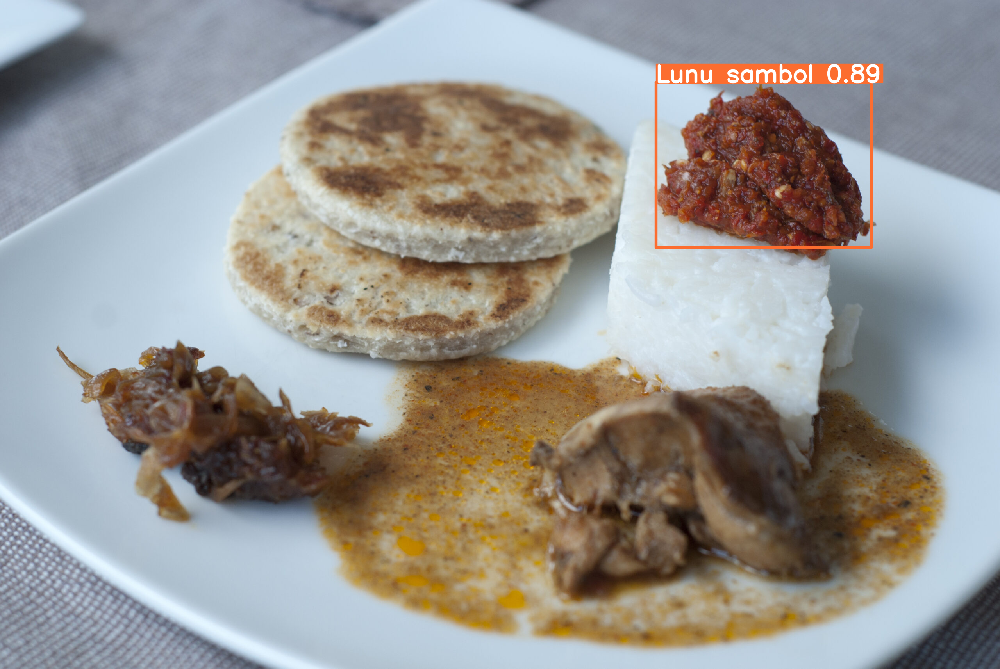

Detected foods:
  - Lunu sambol, Confidence: 0.89

--- Testing: new_food_images/tnew4 (1).jpg ---

image 1/1 /content/new_food_images/tnew4 (1).jpg: 384x640 1 Dhal Curry, 1 Gotukola Mallum, 2 Pol Sambols, 11.5ms
Speed: 2.9ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/new_food_images/tnew4 (1).jpg: 384x640 1 Dhal Curry, 1 Gotukola Mallum, 2 Pol Sambols, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


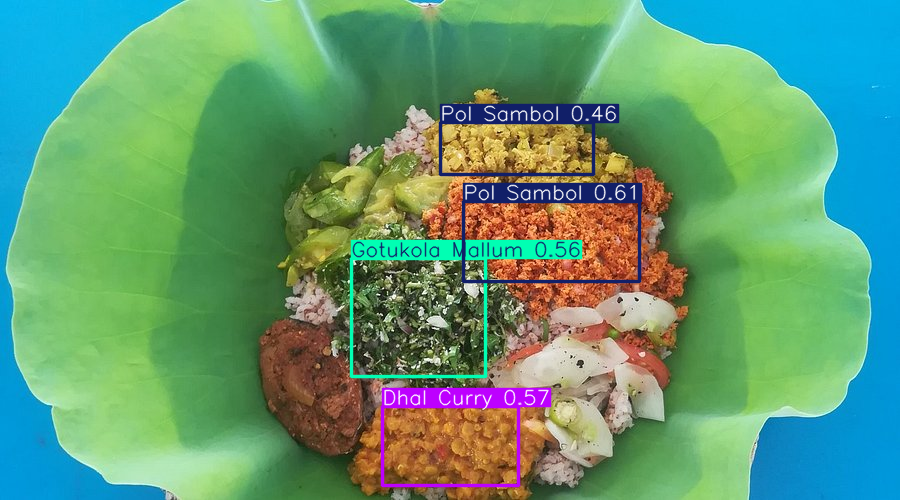

Detected foods:
  - Pol Sambol, Confidence: 0.61
  - Dhal Curry, Confidence: 0.57
  - Gotukola Mallum, Confidence: 0.56
  - Pol Sambol, Confidence: 0.46

--- Testing: new_food_images/tnew5 (1).jpg ---

image 1/1 /content/new_food_images/tnew5 (1).jpg: 448x640 1 Dhal Curry, 1 Pol Sambol, 13.5ms
Speed: 3.1ms preprocess, 13.5ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/tnew5 (1).jpg: 448x640 1 Dhal Curry, 1 Pol Sambol, 12.5ms
Speed: 3.0ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


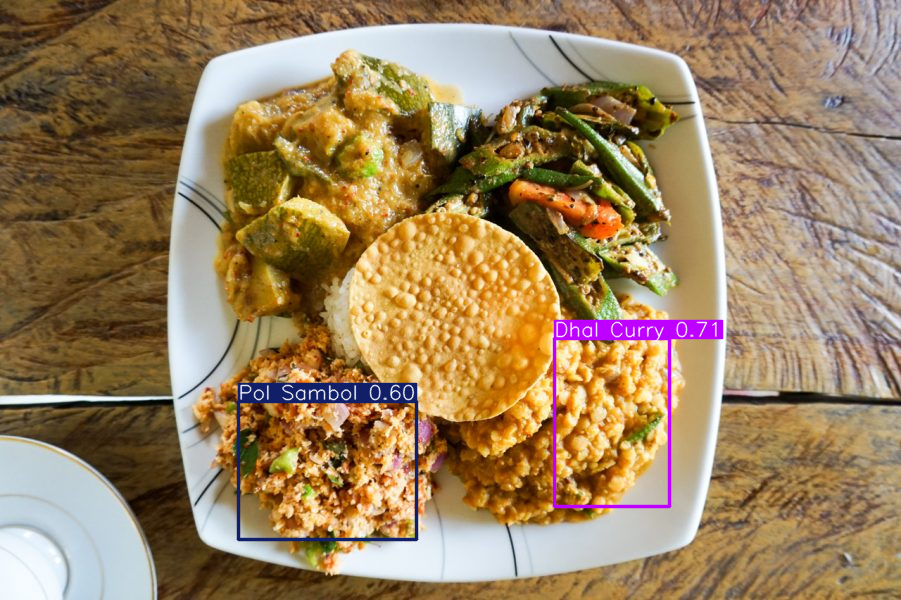

Detected foods:
  - Dhal Curry, Confidence: 0.71
  - Pol Sambol, Confidence: 0.60

--- Testing: new_food_images/tnew6 (1).jpg ---

image 1/1 /content/new_food_images/tnew6 (1).jpg: 640x640 3 Gotukola Mallums, 1 Potato Curry, 1 Red rice, 17.6ms
Speed: 4.2ms preprocess, 17.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/new_food_images/tnew6 (1).jpg: 640x640 3 Gotukola Mallums, 1 Potato Curry, 1 Red rice, 15.9ms
Speed: 3.8ms preprocess, 15.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


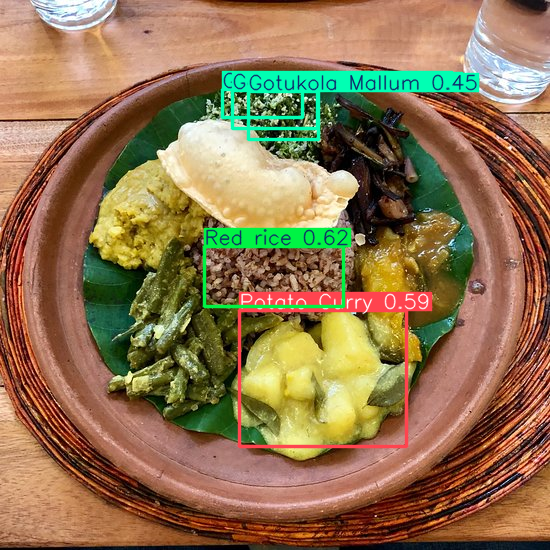

Detected foods:
  - Red rice, Confidence: 0.62
  - Potato Curry, Confidence: 0.59
  - Gotukola Mallum, Confidence: 0.45
  - Gotukola Mallum, Confidence: 0.28
  - Gotukola Mallum, Confidence: 0.25

--- Testing: new_food_images/tnew7 (1).jpeg ---

image 1/1 /content/new_food_images/tnew7 (1).jpeg: 640x480 1 Beetroot Curry, 1 Cashew Curry, 3 Pol Sambols, 12.9ms
Speed: 3.9ms preprocess, 12.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/new_food_images/tnew7 (1).jpeg: 640x480 1 Beetroot Curry, 1 Cashew Curry, 3 Pol Sambols, 11.8ms
Speed: 4.0ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


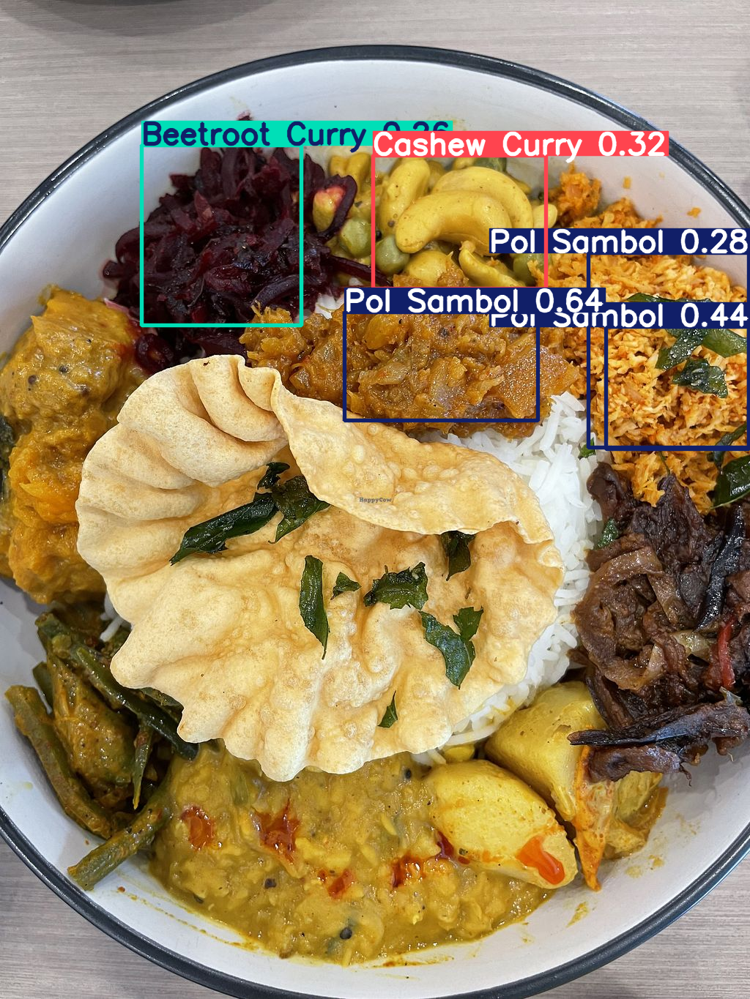

Detected foods:
  - Pol Sambol, Confidence: 0.64
  - Pol Sambol, Confidence: 0.44
  - Cashew Curry, Confidence: 0.32
  - Pol Sambol, Confidence: 0.28
  - Beetroot Curry, Confidence: 0.26


In [6]:
# ==========================
# Cell 3: Test on new/unseen images
# ==========================

from ultralytics import YOLO
from google.colab import files
import os

# 1️⃣ Load your trained YOLOv8 model
model = YOLO("/content/runs/detect/meal_plate_test/quick_train/weights/best.pt")

# 2️⃣ Upload one or more new images (simulate user uploads)
print("Upload new meal plate images (you can select multiple):")
uploaded = files.upload()  # user selects image files

# 3️⃣ Create a folder to save uploaded images
os.makedirs("new_food_images", exist_ok=True)

# Save uploaded images
uploaded_files = []
for filename in uploaded.keys():
    path = os.path.join("new_food_images", filename)
    uploaded_files.append(path)
    with open(path, "wb") as f:
        f.write(uploaded[filename])
print(f"{len(uploaded_files)} image(s) uploaded for testing.")

# 4️⃣ Run predictions on each uploaded image
for img_path in uploaded_files:
    print("\n--- Testing:", img_path, "---")
    results = model.predict(img_path)  # Run YOLO detection

    # Show the image with bounding boxes
    results = model.predict(img_path)  # Run YOLO detection

    # Show the image with bounding boxes
    results[0].show()

    # Print detected foods with confidence scores
    print("Detected foods:")
    for box in results[0].boxes:
        class_id = int(box.cls[0])
        confidence = float(box.conf[0])
        class_name = model.names[class_id]
        print(f"  - {class_name}, Confidence: {confidence:.2f}")
